# Figures for paper — now with diffusion mapping!

In [1]:
# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

In [2]:
# Import local code
import sys
sys.path.append('../code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from triplets import *
from mri_maps import *
from enrichments import *
from brainspan import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");
%R source("../code/enrichmentsPlots.R");
%R source("../code/plot_maps.R");
%R source("../code/brainspanPlots.R");

/opt/conda/lib/python3.8/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


---

## Set gradient version

In [3]:
pca = gradientVersion(approach='pca').fit('hcp_base')
pca_hcp_3d_ds8 = gradientVersion(approach='pca').fit('hcp_3donors_ds8')
dm_hcp_ds9 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_ds9')
dm_hcp_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds5')

New gradients version: method=pca, kernel=None, data=hcp_base
New gradients version: method=pca, kernel=None, data=hcp_3donors_ds8
New gradients version: method=dm, kernel=normalized_angle, data=hcp_ds9
New gradients version: method=dm, kernel=normalized_angle, data=hcp_3donors_ds5


In [4]:
hcp_version = dm_hcp_ds9

---

## 1 — Distributions

In [5]:
counts_hcp = pd.read_csv("../outputs/counts_hcp.csv", index_col=0)
stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
donor_counts = (counts_hcp!=0).sum(axis=1)[:180].rename('count').to_frame()

In [6]:
stability['ds'].quantile(.9)

0.3859072493003411

## 1 — Gradients on brains

In [7]:
hcp_scores = (pd.concat({
    'PCA, all genes and regions': pca.clean_scores(flips=[1,2]),
    # 'PCA, top 80% DS genes,\nonly 3+ donor regions': pca_hcp_3d_ds8.clean_scores(flips=[]),
    'DM, only top 10% DS genes,\nall regions': dm_hcp_ds9.clean_scores(),
    'DM, top 50% DS genes,\nonly 3+ donor regions': dm_hcp_3d_ds5.clean_scores(flips=[]),
    # 'DM, only top 10% DS genes,\nall regions': dm_hcp_ds9.clean_scores(),
})
        .reset_index(level=0).rename({'level_0':'version'},axis=1)
         )

In [9]:
%%R -i hcp_scores -w 2000 -h 1000
# plot_hcp(hcp_scores, three=T) & theme(text=element_text(size=36))

NULL


## 1 — Triplets filtering

Load triplets data from pickles since triplets are slow to compute

In [8]:
triplets_hcp = load_pickle('triplets_hcp')
triplets_hcp_3donors = load_pickle('triplets_hcp_3donors')

In [9]:
triplets_pca = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp, use_gradientVersion=True, approach='pca'), with_coefs=False)
triplets_dm = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp, use_gradientVersion=True, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)
triplets_dm_3d = make_triplet_ds_plot(get_triplets_ds_levels(triplets_hcp_3donors, use_gradientVersion=True, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)

In [10]:
triplets_dict = {
    'PCA': triplets_pca, 
    'Diffusion Maps (DM)': triplets_dm,
    # 'Diffusion Map, 2+ donors/region': triplets_dm_2d,
    'DM, only 3+ donors regions': triplets_dm_3d
}

triplets_plot_v2 = (pd.concat(triplets_dict)
 .reset_index(0)
 .rename({'level_0':'method', 'version':'DS'}, axis=1)
 .assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))
                   )

df_triplets_highlight = pd.DataFrame({'method': triplets_dict.keys(), 'DS':[0,.9,.5]}).assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))

## 2 — Brainspan mapping

In [11]:
bs_cortex_mapping = get_bs_cortex_mapping()
hcp_bs_mapping = get_hcp_bs_mapping(bs_cortex_mapping)

In [12]:
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, bs_cortex_mapping)
bs_agg = aggregate_brainspan_by_age(bs_clean)

## 2 — Brainspan development

In [13]:
weights_version = dm_hcp_3d_ds5

In [14]:
scores_cortex = get_mapped_scores(weights_version, hcp_bs_mapping)
bs_scores = compute_brainspan_scores(bs_agg, weights_version, bs_cortex_mapping)

In [15]:
age_groups = get_age_groups()
bs_scores_corr = correlate_bs_scores(bs_scores, scores_cortex, age_groups=age_groups)

## 2 — Brainspan adult correlation

In [16]:
cortex_scores, cortex_corrs = get_cortex_scores(bs_scores, scores_cortex, age_groups, bs_cortex_mapping)

# Fig 1

Message: With careful processing, PC2 and PC3 of the AHBA are robust and generalizable.

In [93]:
%%R -w 20 -h 28 --units in -r 300 -i triplets_plot_v2 -i donor_counts -i stability -i hcp_scores -i df_triplets_highlight -i hcp_bs_mapping -i cortex_scores -i cortex_corrs
# %%R -w 2000 -h 2100 -i triplets_plot_v2 -i donor_counts -i stability -i hcp_scores -i df_triplets_highlight
source("../code/Rplots.R")
source("../code/brainspanPlots.R")
library(magick)

img <- image_read("../data/schematics/fig1_schem.png")

g0 <- image_ggplot(img)
g1a <- plot_ds_dist_hcp(stability)
g1b <- plot_dist_donors_hcp(donor_counts)
g2 <- plot_triplets_v2(triplets_plot_v2) + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey')
g3 <- plot_hcp(hcp_scores, three=T, switch='y') + theme(legend.position='right') + guides(fill=guide_colorbar(title='Score', barheight=10, title.hjust=0))

g4a <- plot_bs_mapping(hcp_bs_mapping)
g4b <- plot_ahba_bs_scatter(cortex_scores, cortex_corrs)

caption <- paste("**Figure 1:**",
                "**A**, Schematic of triplet method to ensure generalizability of AHBA gradients.",
                "**B**, Distribution of differential stability across AHBA donors of each gene's expression in the HCP-MMP1.0 parcellation.",
                "**C**, Distribution of how many AHBA donors are represented in each region of the HCP-MMP1.0 parcellation.",
                "**D**, Correlations of region scores vs % of top DS genes retained, between on independently processed triplets of the six AHBA donor brains, for PCA, DM, and DM when filtered for the 137/180 regions with samples from at least 3 of the 6 donors.",
                "**E**, Region scores of AHBA gradients in HCP-MMP1.0 parcellation using all six donors; for PCA with all genes, DM with only the top 10% of genes, and DM with the top 50% of genes for only the 137/180 regions with samples from at least 3 of the 6 donors.",
                "**F**, Sampled regions from the independent BrainSpan RNA-seq dataset, matched to the HCP-MMP1.0 parcellation.",
                "**G**, BrainSpan RNA-seq gene expression for adult brains (18-40 yrs) in matched regions scored with gene weights from AHBA gradients, vs AHBA gradient mean scores in the matched HCP regions."
)


layout <- c(
  # Schematic and distributions    
  area(t = 1, b = 2, l = 1, r = 5),
  area(t = 1, b = 1, l = 6, r = 6),
  area(t = 2, b = 2, l = 6, r = 6),
  # Triplets
  area(t = 3, b = 5, l = 1, r = 6),
  # Brain maps
  area(t = 6, b = 9, l = 1, r = 6),
  # Brainspan
  area(t = 10, b = 11, l = 1, r = 3),
  area(t = 10, b = 11, l = 4, r = 6) 

)
plot <- g0 + g1a + g1b + g2 + g3 + g4a + g4b + plot_layout(design = layout)

themed <- plot & theme(
    text=element_text(size=20), 
    strip.text=element_text(size=20),
    
    strip.text.x=element_text(size=20),
    strip.text.y=element_text(size=20),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', vjust=-2)
)
    
annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated
# ggsave(filename='test2.png', device='png')

---

# Fig 2 — Enrichments

## Gene weight vs DS

In [85]:
stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')

weights_ds = (dm_hcp_3d_ds5.weights
            .iloc[:,:3].set_axis(['G1','G2','G3'],axis=1)
            .join(stability)
             )

## Cell enrichments

In [27]:
cell_genes = get_cell_genes()
weights_version = dm_hcp_3d_ds5
weights_version.fit_weights();

weights = weights_version.weights.iloc[:,:3]
gene_masks = match_cell_genes(cell_genes, weights)
nulls = shuffle_gene_weights(weights, n=10000, rank=False)

In [28]:
gene_masks = match_cell_genes(cell_genes, weights)

In [29]:
true_scores, null_scores = compute_cell_scores(
    weights, nulls, gene_masks, how='mean')

cell_null_p = compute_null_p(true_scores, null_scores, adjust='fdr_bh')

## 3 — STRING enrichments

In [89]:
enrichments_keywords = combine_enrichments('dm_hcp_3d_ds5', 'Keyword', include_g1=True)
enrichments_process = combine_enrichments('dm_hcp_3d_ds5', 'Process', include_g1=True)

In [90]:
hcp_scores_single = dm_hcp_ds9.clean_scores(flips=[])

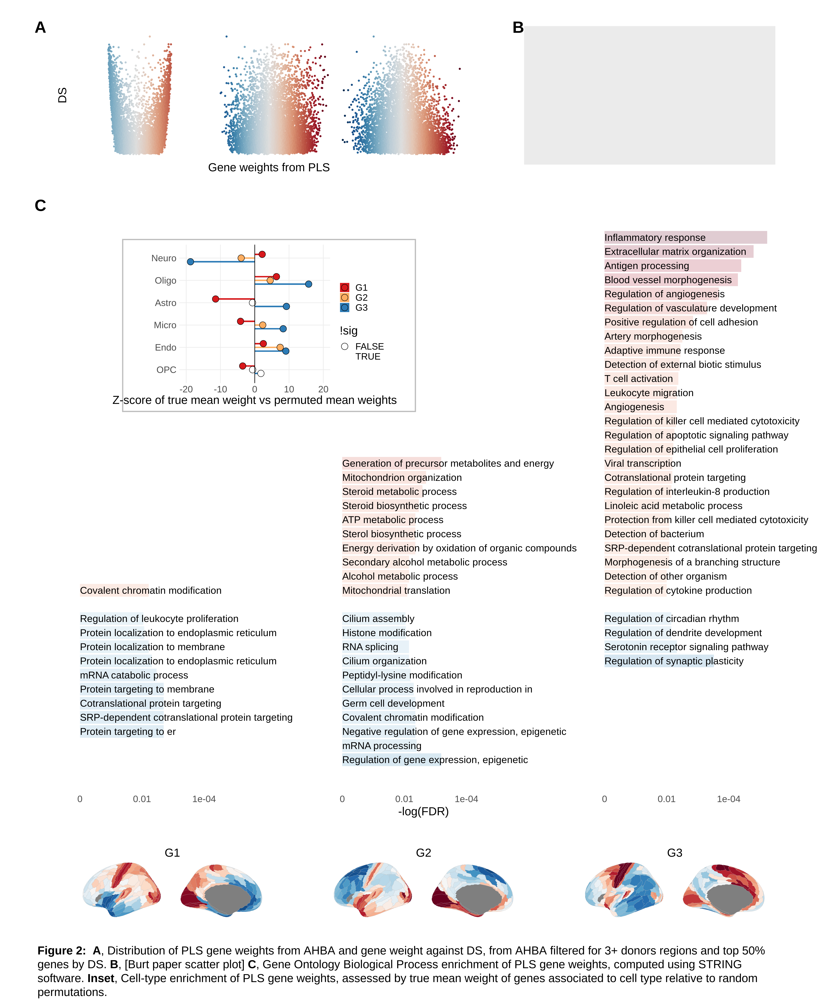

In [91]:
%%R -w 20 -h 24 --units in -r 300 -i hcp_scores_single -i bs_scores_corr -i cell_null_p -i enrichments_process -i enrichments_keywords -i weights_ds
source("../code/enrichmentsPlots.R")
source("../code/brainspanPlots.R")

g0 <- plot_weights_ds(weights_ds)
# g0a <- plot_weights_dist(weights_ds)
g1 <- ggplot() + geom_blank()
g2 <- plot_enrichments_v2(enrichments_process, size=6) + theme(strip.text.x=element_blank())
g3 <- plot_cell_dotplot(cell_null_p) + plot_layout(tag_level='new') + theme(plot.background = element_rect(colour = "grey", fill=NA, size=2))
g4 <- plot_hcp_wide(hcp_scores_single, spacing=6) + guides(fill='none') + plot_layout(tag_level='new') + theme(strip.text.x=element_text(size=20))

layout <- c(
  area(t = 1, b = 4, l = 1, r = 5),
  area(t = 1, b = 4, l = 6, r = 10),
  area(t = 5, b = 20, l = 1, r = 10),
  area(t = 6, b = 9, l = 2, r = 4),
  area(t = 21, b = 22, l = 1, r = 10)
)

plot <- g0 + g1 + g2 + g3 + g4 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20),
    plot.margin = margin(t=10, r=50, b=10, l=30, "pt"),
    plot.tag = element_text(size=28, face='bold', vjust=-2)
)

caption <- paste("**Figure 2:**",
                 "**A**, Distribution of PLS gene weights from AHBA and gene weight against DS, from AHBA filtered for 3+ donors regions and top 50% genes by DS.",
                 "**B**, [Burt paper scatter plot]",
                 "**C**, Gene Ontology Biological Process enrichment of PLS gene weights, computed using STRING software.",
                 "**Inset**, Cell-type enrichment of PLS gene weights, assessed by true mean weight of genes associated to cell type relative to random permutations."
)

annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

# Fig 3 — maps

In [281]:
maps=get_maps()
hcp_scores = dm_hcp_ds9.clean_scores()
corrs = get_corrs(hcp_scores, maps, method='pearson')

In [282]:
sim_grads = np.load("../outputs/permutations/sim_gradients_1000.npy")
null_corrs = corr_nulls_from_grads(sim_grads, hcp_scores, maps, method='pearson')
null_p = get_null_p(corrs, null_corrs, adjust='fdr_bh')

## Scatter

In [283]:
maps_to_plot = ['Cortical Thickness', 'Glycolytic Index (CMRO2/CMRGlu)\n(Aerobic Glycolysis)']
maps_scatter = maps.loc[:,maps_to_plot].melt(ignore_index=False, var_name='map', value_name='map_score').join(hcp_scores.set_index('label')).reset_index()
maps_scatter_corrs = null_p.query("map in @maps_to_plot & G in ['G1','G2']").loc[:,['map','G','true_mean','q']]
maps_to_plot = maps.loc[:,maps_to_plot]

## All corrs

In [284]:
null_p_plot = null_p.loc[lambda x: ~np.isin(x['map'], ['Cerebral Blood Volume', 'Arterial Spin Labelling'])]

## PCA

In [285]:
from sklearn.decomposition import PCA

maps_drop = maps.loc[:, lambda x: ~np.isin(x.columns, ['Cerebral Blood Volume', 'Arterial Spin Labelling'])]
maps_pca = PCA(n_components=2).fit(maps_drop)
map_pca_scores = maps_pca.transform(maps_drop)
map_pca_scores = pd.DataFrame(map_pca_scores, index=maps_drop.index, columns=['G2','G1']).apply(lambda x: (x-np.mean(x))/np.std(x))

both_scores = pd.concat({
    'AHBA':hcp_scores.set_index('label').iloc[:,:2],
    'maps':map_pca_scores * [-1,1]
}, axis=1) 

In [325]:
map_weights_index = pd.Series(maps_drop.columns).replace({
        'T1w/T2w\n(Anatomical Hierarchy)':'T1/T2',
        'Cortical Thickness':'CT',
         'fMRI PC1\n(Functional Hierarchy)':'fMRI',
        'Oxygen Metabolism (CMRO2)':'CMRO2',
        'Glucose Metabolism (CMRGlu)':'CMRGlu',
        'Glycolytic Index (CMRO2/CMRGlu)\n(Aerobic Glycolysis)':'GI',
        'Developmental Expansion':'Dev. Exp.',
        'Evolutionary Expansion\n(Evolutionary Hierarchy)':'Evo. Exp.',
        'Externopyramidisation':'Externopyramidisation',
        'Cerebral Blood Flow':'CBF',
        'Allometric Scaling':'Allom.',
         'NeuroSynth PC1':'Neurosynth',
})
maps_pca_weights = pd.DataFrame(maps_pca.components_.T, columns=['G1','G2'], index=map_weights_index)
maps_pca_weights

,G1,G2
T1/T2,-0.060180,0.495146
CT,0.131333,-0.378861
fMRI,-0.159652,-0.422549
CMRO2,-0.378261,0.329212
CMRGlu,-0.487408,0.139120
GI,-0.411775,-0.178200
Dev. Exp.,-0.228229,-0.286157
Evo. Exp.,-0.179296,-0.333658
Externopyramidisation,0.254958,0.175420
CBF,-0.398097,0.127940


In [286]:
both_scores_plot = both_scores.stack(0).reset_index().rename({'level_1':'version'}, axis=1) \
                    .assign(version = lambda x: x['version'].replace({'AHBA':'AHBA DM', 'maps':'MRI maps PCA'}))

In [287]:
both_scores_scatter = both_scores.stack(1).reset_index().rename({'level_1':'G'}, axis=1)

In [293]:
both_scores.corr().iloc[:2,2:]

maps          
               G2        G1
AHBA G1  0.399193  0.709500
     G2  0.642637 -0.336486

In [305]:
maps_pca_weights

,G1,G2
T1w/T2w\n(Anatomical Hierarchy),-0.060180,0.495146
Cortical Thickness,0.131333,-0.378861
fMRI PC1\n(Functional Hierarchy),-0.159652,-0.422549
Oxygen Metabolism (CMRO2),-0.378261,0.329212
Glucose Metabolism (CMRGlu),-0.487408,0.139120
Glycolytic Index (CMRO2/CMRGlu)\n(Aerobic Glycolysis),-0.411775,-0.178200
Developmental Expansion,-0.228229,-0.286157
Evolutionary Expansion\n(Evolutionary Hierarchy),-0.179296,-0.333658
Externopyramidisation,0.254958,0.175420
Cerebral Blood Flow,-0.398097,0.127940


In [326]:
%%R -i both_scores_scatter -i maps_pca_weights
plot_both_scores_scatter <- function(both_scores_scatter) {
    both_scores_scatter %>%
    ggplot(aes(x=AHBA, y=maps)) +
    facet_grid(G~., switch='y') +
    geom_point() +
    geom_point(alpha=.3) +
    geom_smooth(method='lm', color=brewer.rdbu(5)[5]) +
    geom_text(data=data.frame(G=c('G1','G2'), r=c(0.71, 0.64)), aes(label=paste('r =', r), x=-1, y=2), size=6, hjust=0.5, vjust=0.5) +
    scale_x_continuous(breaks=0) + scale_y_continuous(breaks=0) +
    xlab('') + ylab('') +
    theme_minimal() +
    theme(strip.placement='outside',
          # strip.text.y=element_blank(),
          strip.text.y.left=element_text(angle=0),
          panel.grid.minor=element_blank(),
          axis.text = element_blank(),
          aspect.ratio=1,
          text=element_text(size=20)
         )
}

library(ggrepel)
plot_map_weights <- function(map_weights) {
    lim <- max(map_weights)+.1
    # lim2 <- lim+0.1

    df <- map_weights %>%
    rownames_to_column('map')
    
    df %>%
    ggplot(aes(G1, G2)) +
    geom_point() +
    geom_text_repel(aes(label=map), size=5, data=df) + 
    geom_vline(xintercept=0) + geom_hline(yintercept=0) +
    lims(x=c(-lim,lim), y=c(-lim,lim)) +
    coord_cartesian(clip='off') +
    labs(x='',y='') +
    annotate(geom='text', x=c(-lim, 0), y=c(0,-lim), label=c('PC1', 'PC2'), vjust=.5, hjust=.5, size=5, fontface='bold') +
    theme_minimal() +
    theme(aspect.ratio=1,
          panel.grid=element_blank(),
          axis.text=element_blank(),
          text=element_text(size=20)
         )
}

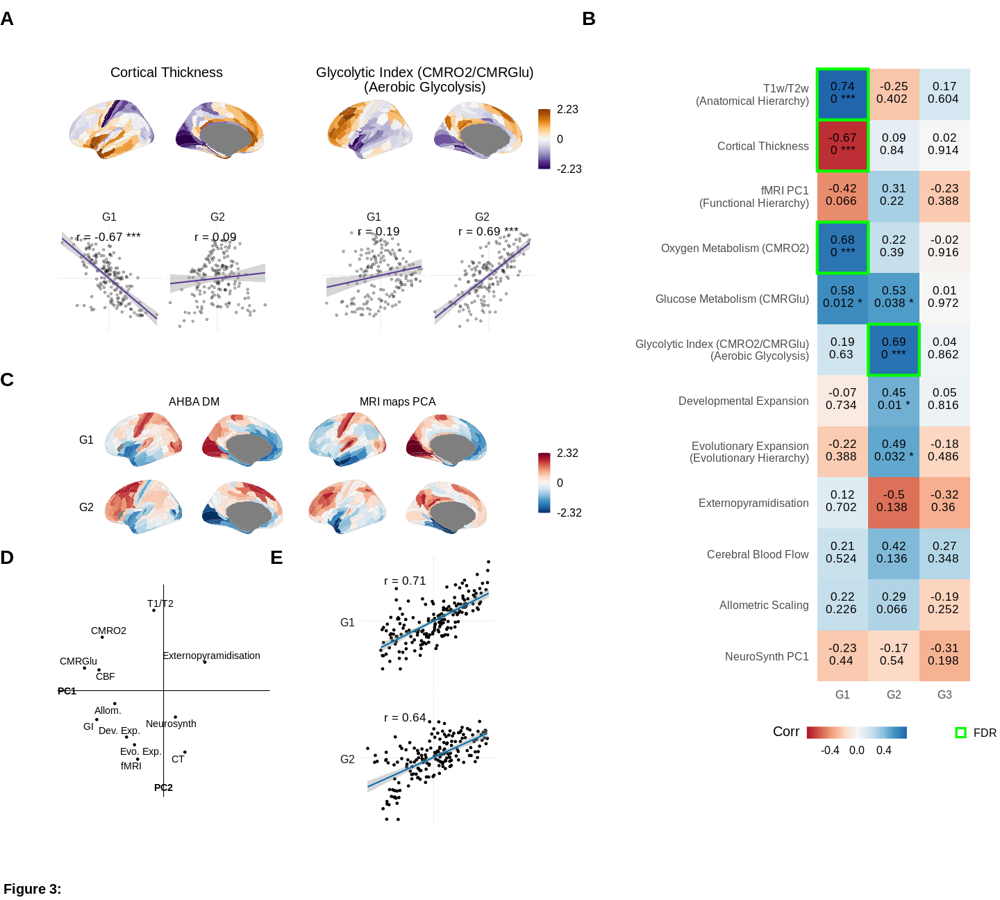

In [327]:
%%R -w 20 -h 18 --units in -i maps_scatter -i maps_scatter_corrs -i maps_to_plot -i null_p_plot -i both_scores_plot -i both_scores_scatter -i maps_pca_weights
source("../code/plot_maps.R")

g1 <- plot_maps(maps_to_plot, ncol=2, colors=rev(brewer.puor(100)), spacing=4) + theme(legend.position='right')
g2a <- plot_maps_scatter(maps_scatter, maps_scatter_corrs, which='Cortical Thickness') + plot_layout(tag_level='new')
g2b <- plot_maps_scatter(maps_scatter, maps_scatter_corrs, which='Glycolytic Index (CMRO2/CMRGlu)\n(Aerobic Glycolysis)') + plot_layout(tag_level='new')
g3 <- plot_corr_versions(null_p_plot %>% mutate(version=''))
g4 <- plot_hcp(both_scores_plot, switch='y') + theme(legend.position='right')
g5 <- plot_map_weights(maps_pca_weights)
g6 <- plot_both_scores_scatter(both_scores_scatter)


layout <- c(
  # CT and GI maps
  area(t = 1, b = 2, l = 1, r = 6),
  # CT and GI scatters
  area(t = 3, b = 4, l = 1, r = 3),
  area(t = 3, b = 4, l = 4, r = 6),
  # All corrs heatmap
  area(t = 1, b = 8, l = 7, r = 9),
  # AHBA vs MRI maps
  area(t = 5, b = 6, l = 1, r = 6),
  # MRI weights
  area(t = 7, b = 9, l = 1, r = 3),
  # AHBA vs MRI scatter
  area(t = 7, b = 9, l = 4, r = 6)
)

plot <- g1 + g2a + g2b + g3 + g4 + g5 + g6 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=20),
    plot.margin = margin(t=0, r=0, b=0, l=0, "pt"),
    plot.tag = element_text(size=28, face='bold', vjust=-2)
)

caption <- paste("**Figure 3:**"
                 # "**A**, Distribution of PLS gene weights from AHBA and gene weight against DS, from AHBA filtered for 3+ donors regions and top 50% genes by DS.",
                 # "**B**, [Burt paper scatter plot]",
                 # "**C**, Gene Ontology Biological Process enrichment of PLS gene weights, computed using STRING software.",
                 # "**Inset**, Cell-type enrichment of PLS gene weights, assessed by true mean weight of genes associated to cell type relative to random permutations."
)

annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

## Disorder maps

In [45]:
dm_dk_ds9 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('dk_ds9')

New gradients version: method=dm, kernel=normalized_angle, data=dk_ds9


In [189]:
maps = get_disorder_maps().drop(['ADHD', 'ANX', 'MCI'], axis=1)
null_corrs_dict_disorders = load_pickle('null_corrs_dict_disorders')

In [190]:
dk_scores = dm_dk_ds9.clean_scores().iloc[:,:3].rename_axis('region')
corrs = get_corrs(dk_scores, maps, atlas='dk')
null_corrs = null_corrs_dict_disorders['sim_grads_p']

disorder_corrs = get_null_p(corrs, null_corrs, adjust='fdr_bh').assign(version='')

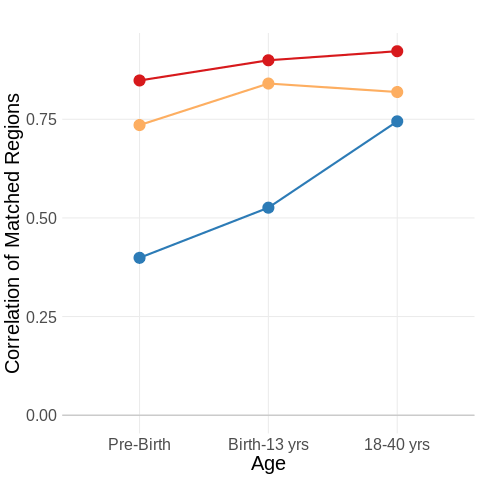

In [331]:
%%R -i bs_scores_corr
source("../code/brainspanPlots.R")
plot_bs_scores_corr(bs_scores_corr) & theme(text=element_text(size=20)) 

## 2 — Parcellations

In [88]:
dm_dk_ds9 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('dk_ds9')
dm_dx_ds9 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('dx_ds9')

New gradients version: method=dm, kernel=normalized_angle, data=dk_ds9
New gradients version: method=dm, kernel=normalized_angle, data=dx_ds9


In [89]:
hcp_scores = dm_hcp_ds9.clean_scores().assign(version='HCP-MMP1.0,\ntop 10% DS genes')
dk_scores = dm_dk_ds9.clean_scores().assign(version='Desikan-Killiany,\ntop 10% DS genes')
dx_scores = dm_dx_ds9.clean_scores().assign(version='Desterieux,\ntop 10% DS genes')

## 2 — Parcellation gene weight corrs

In [91]:
corrs_dict = {
    'HCP-MMP1.0,\ntop 10% DS genes': correlate(dm_hcp_ds9.fit_weights(overwrite=False), weights_version.weights),
    'Desikan-Killiany,\ntop 10% DS genes': correlate(dm_dk_ds9.fit_weights(), weights_version.weights),
    'Desterieux,\ntop 10% DS genes': correlate(dm_dx_ds9.fit_weights(), weights_version.weights)
}

weight_corrs = (pd.concat(corrs_dict)
 .melt(ignore_index=False)
 .reset_index()
 .set_axis(['version','x','y','corr'], axis=1)
 .loc[lambda x: (x['x'] < 3) & (x['y'] < 3)]
 .replace({'x':{0:'G1',1:'G2',2:'G3'}, 'y':{0:'G1',1:'G2',2:'G3'}})
)

In [92]:
def count_gene_overlap(v1, v2):
    overlap = set(v1.weights.index).intersection(set(v2.weights.index))
    overlap_v1 = round(len(overlap)/len(v1.weights.index),2)*100
    overlap_v2 = round(len(overlap)/len(v2.weights.index),2)*100
    print(f'Overlap is {overlap_v1}% of v1 genes, {overlap_v2}% of v2 genes')
    
count_gene_overlap(dm_hcp_ds9, dm_dk_ds9)

Overlap is 85.0% of v1 genes, 85.0% of v2 genes


# Fig 2

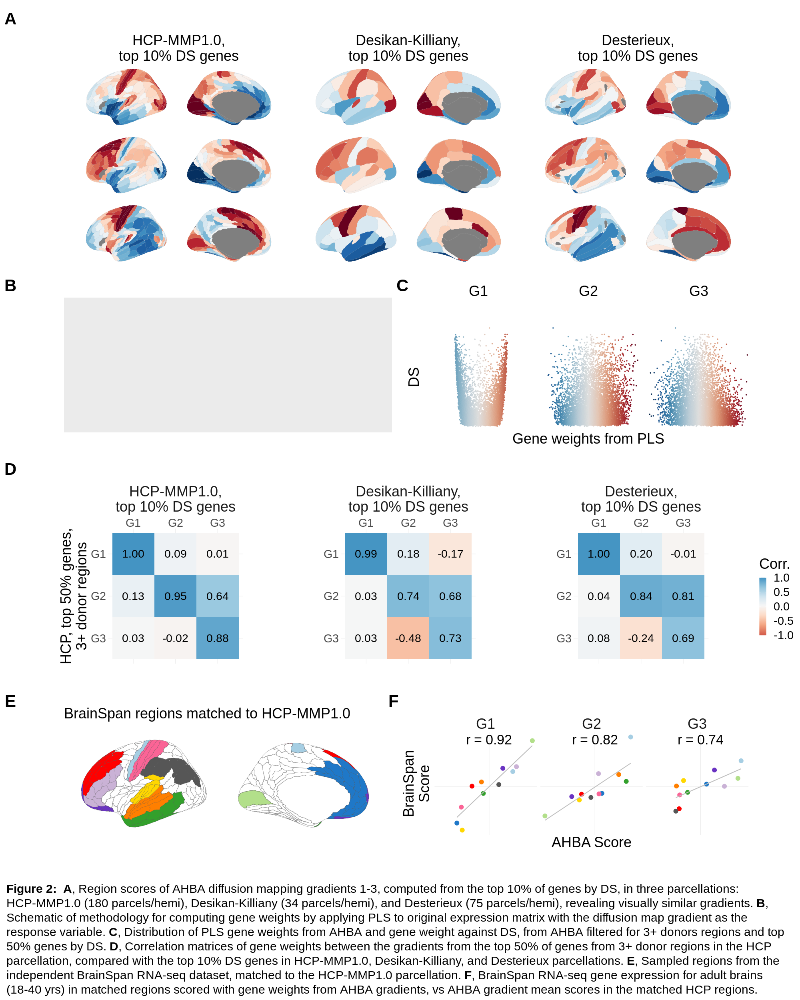

In [95]:
%%R -w 2000 -h 2500 -i hcp_scores -i dk_scores -i dx_scores -i weight_corrs -i bs_scores_corr -i cortex_scores -i cortex_corrs -i hcp_bs_mapping -i weights_ds
source("../code/Rplots.R")
source("../code/brainspanPlots.R")

g1a <- plot_hcp(hcp_scores, three=T)
g1b <- plot_dk(dk_scores, three=T) + plot_layout(tag_level='new')
g1c <- plot_dx(dx_scores, three=T) + plot_layout(tag_level='new')

g_img <- ggplot(data.frame())

g0 <- plot_weights_ds(weights_ds) + plot_layout(tag_level='new')
g0a <- plot_weights_dist(weights_ds)

g2 <- plot_weight_corrs(weight_corrs)

g3 <- plot_bs_mapping(hcp_bs_mapping)
g4 <- plot_ahba_bs_scatter(cortex_scores, cortex_corrs)


plot <- (
    # Row 1
    ((g1a | g1b | g1c) & theme(legend.position='none', strip.text.y=element_blank())) /
    # Row 2
    (g_img | ((g0a / (g0 )) + plot_layout(heights=c(1,5)))) /
    # Row 3
    g2 /
    # Row 4
    (g3 | g4) 
) + plot_layout(heights=c(3,2,2,2))


caption <- paste("**Figure 2:**",
                 "**A**, Region scores of AHBA diffusion mapping gradients 1-3, computed from the top 10% of genes by DS, in three parcellations: HCP-MMP1.0 (180 parcels/hemi), Desikan-Killiany (34 parcels/hemi), and Desterieux (75 parcels/hemi), revealing visually similar gradients.",
                 "**B**, Schematic of methodology for computing gene weights by applying PLS to original expression matrix with the diffusion map gradient as the response variable.",
                 "**C**, Distribution of PLS gene weights from AHBA and gene weight against DS, from AHBA filtered for 3+ donors regions and top 50% genes by DS.",
                 "**D**, Correlation matrices of gene weights between the gradients from the top 50% of genes from 3+ donor regions in the HCP parcellation, compared with the top 10% DS genes in HCP-MMP1.0, Desikan-Killiany, and Desterieux parcellations.",
                 "**E**, Sampled regions from the independent BrainSpan RNA-seq dataset, matched to the HCP-MMP1.0 parcellation.",
                 "**F**, BrainSpan RNA-seq gene expression for adult brains (18-40 yrs) in matched regions scored with gene weights from AHBA gradients, vs AHBA gradient mean scores in the matched HCP regions."
                )

themed <- plot & theme(
    text=element_text(size=36), 
    strip.text = element_text(size=36),
    plot.tag = element_text(size=42, face='bold', vjust=-2))
annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 30, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

# Fig 4 — Maps

## MRI maps

In [187]:
maps = get_maps()#.drop(['Size Variation (allometric scaling)', 'fMRI PC1', 'NeuroSynth PC1'], axis=1)
null_corrs_dict = load_pickle('null_corrs_dict')

In [188]:
hcp_scores = dm_hcp_ds9.clean_scores().iloc[:,:3].rename_axis('region')
corrs = get_corrs(hcp_scores, maps, atlas='hcp')
null_corrs = null_corrs_dict['sim_grads_p']

mri_corrs = get_null_p(corrs, null_corrs, adjust='fdr_bh').assign(version='')

## Disorder maps

In [45]:
dm_dk_ds9 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('dk_ds9')

New gradients version: method=dm, kernel=normalized_angle, data=dk_ds9


In [189]:
maps = get_disorder_maps().drop(['ADHD', 'ANX', 'MCI'], axis=1)
null_corrs_dict_disorders = load_pickle('null_corrs_dict_disorders')

In [190]:
dk_scores = dm_dk_ds9.clean_scores().iloc[:,:3].rename_axis('region')
corrs = get_corrs(dk_scores, maps, atlas='dk')
null_corrs = null_corrs_dict_disorders['sim_grads_p']

disorder_corrs = get_null_p(corrs, null_corrs, adjust='fdr_bh').assign(version='')

## For plotting brains

In [96]:
maps_to_plot = [
    'Myelination (T1w/T2w ratio)',
    'Glycolytic Index (CMRO2/CMRGlu)',
    'Developmental Expansion'
]

hcp_maps = maps.loc[:, maps_to_plot]

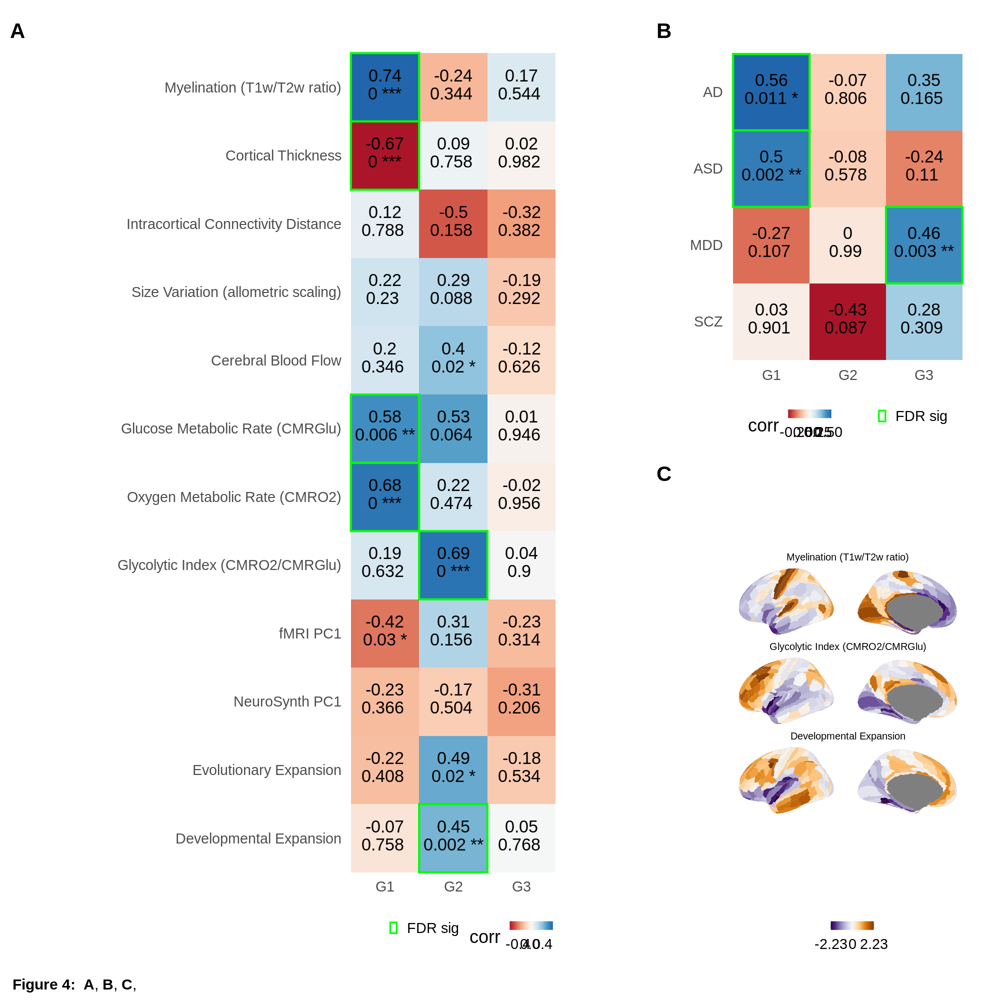

In [191]:
%%R -i mri_corrs -i disorder_corrs -i hcp_maps -w 2000 -h 2000
source("../code/plot_maps.R")
g1 <- plot_corr_versions(mri_corrs, size=12)
g2 <- plot_corr_versions(disorder_corrs, size=12)
g3 <- plot_maps(hcp_maps, ncol=1, colors=rev(brewer.puor(100)))

plot <- (
    g1 | 
    (g2 / g3)
) + plot_layout(widths=c(3,2))

themed <- plot & theme(
    text=element_text(size=36),
    plot.margin = margin(t=10, r=30, b=10, l=10, "pt"),
    plot.tag = element_text(size=42, face='bold', vjust=-2)
)

caption <- paste("**Figure 4:**",
                "**A**, ",
                "**B**, ",
                "**C**, "
)

annotated <- themed + plot_annotation(
  tag_level='A',
  caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 30, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated